Realizar o Download das bibliotecas

In [1]:
# bibliotecas utilizadas
!pip install requests pandas folium numpy geopandas osmnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.9/102.9 kB 2.2 MB/s eta 0:00:00


In [3]:
import pandas as pd
import numpy
import geopandas as gpd
import osmnx as ox
from shapely.wkt import loads
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString
import folium
from folium import GeoJson, Popup

In [4]:
# Defina a localização (no caso, Porto Alegre)
place_name = "Porto Alegre, Brazil"
# Baixe os dados dos parques usando o OSMnx
tags = {'leisure': 'park'}
gdf = ox.geometries_from_place(place_name, tags)
# Crie um DataFrame a partir dos dados baixados
df = gpd.GeoDataFrame(gdf)
# Salve o DataFrame em um arquivo CSV
df.to_csv("POA.csv", index=False)
# Exiba as primeiras linhas do DataFrame

<ipython-input-4-c7e35ed5047c>:5: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  gdf = ox.geometries_from_place(place_name, tags)
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>

In [5]:
# da tabela original (df) filtrar as seguintes colunas
dados_novos=df[["name", "geometry"]]
dados_novos.info()
# salvar os arquivos
dados_novos.to_csv('df_geoutf.csv', encoding='utf-8', index=False)

<class 'geopandas.geodataframe.GeoDataFrame'>
MultiIndex: 768 entries, ('node', 11157611708) to ('relation', 11181225)
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   name      687 non-null    object  
 1   geometry  768 non-null    geometry
dtypes: geometry(1), object(1)
memory usage: 36.7+ KB


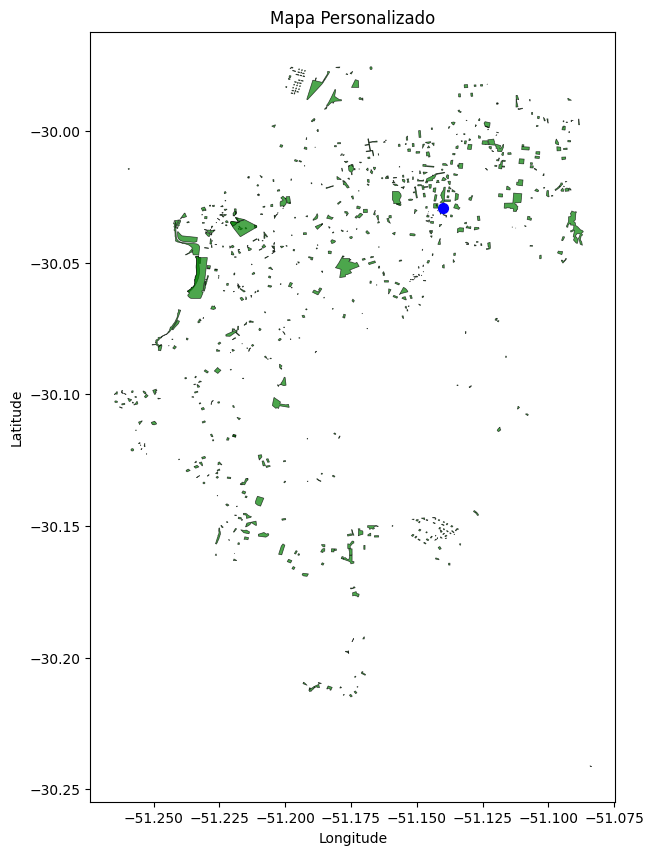

In [79]:
dados_novos = pd.read_csv('/content/df_geoutf.csv')
# Convertendo a coluna "geometry" para objetos Shapely
dados_novos['geometry'] = dados_novos['geometry'].apply(lambda x: loads(x))
gdf = gpd.GeoDataFrame(dados_novos, geometry='geometry')
gdf_points = gdf[gdf['geometry'].geom_type == 'Point']
gdf_polygons = gdf[gdf['geometry'].geom_type.isin(['Polygon', 'MultiPolygon'])]
fig, ax = plt.subplots(figsize=(10, 10))
# Plotar os polígonos em verde
gdf_polygons.plot(ax=ax, color='green', edgecolor='black', linewidth=0.5, alpha=0.7)
# Plotar os pontos em azul
gdf_points.plot(ax=ax, color='blue', markersize=50)
# Adicionar personalizações ao mapa
ax.set_title('Mapa Personalizado')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
# Exibir o mapa personalizado
plt.show()

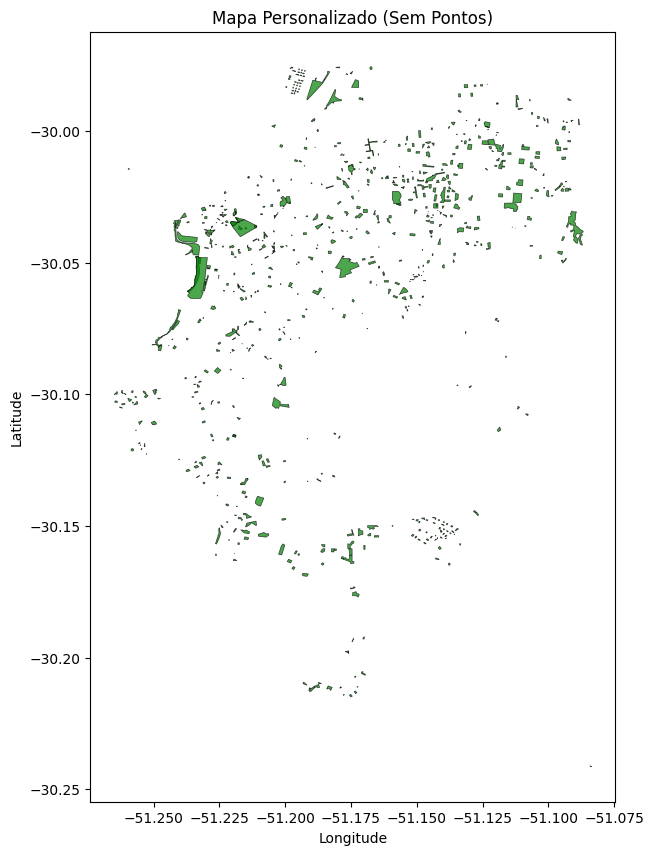

In [80]:
dados_novos = pd.read_csv('/content/df_geoutf.csv')
dados_novos['geometry'] = dados_novos['geometry'].apply(lambda x: loads(x))
gdf = gpd.GeoDataFrame(dados_novos, geometry='geometry')
# Filtrar e excluir geometrias do tipo ponto
gdf_sem_pontos = gdf[gdf['geometry'].geom_type.isin(['Polygon', 'MultiPolygon', 'LineString', 'MultiLineString'])]
fig, ax = plt.subplots(figsize=(10, 10))
# Plotar os polígonos e linhas em verde
gdf_sem_pontos.plot(ax=ax, color='green', edgecolor='black', linewidth=0.5, alpha=0.7)
# Adicionar personalizações ao mapa
ax.set_title('Mapa Personalizado (Sem Pontos)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [7]:
dados_novos = pd.read_csv('/content/df_geoutf.csv')
dados_novos['geometry'] = dados_novos['geometry'].apply(lambda x: loads(x))
gdf = gpd.GeoDataFrame(dados_novos, geometry='geometry')
# Filtrar e excluir geometrias do tipo ponto
gdf_sem_pontos = gdf[gdf['geometry'].geom_type.isin(['Polygon', 'MultiPolygon', 'LineString', 'MultiLineString'])]

In [8]:
frequencia_nome = gdf_sem_pontos['name'].value_counts()
# Exibir a frequência
print(frequencia_nome)

Praça 2                           3
Praça Orixá Xangô                 2
Praça Carlos Ivahy Presser        2
Praça 1                           2
Praça Capitão Carlos Vieira       1
                                 ..
Praça Lucy da Silva Bottini       1
Praça Malaquias José de Souza     1
Praça Monsenhor Antonino Dutra    1
Praça Noel Guarany                1
Largo dos Açorianos               1
Name: name, Length: 682, dtype: int64


In [82]:
# Exclua linhas duplicadas com base na coluna 'name'
df_sem_repetidos = gdf_sem_pontos.drop_duplicates(subset='name', keep='first')
# Mostre a frequência novamente após a remoção de duplicatas
frequencia_nome_sem_repetidos = df_sem_repetidos['name'].value_counts()
# Exiba a frequência após a remoção de duplicatas
print(frequencia_nome_sem_repetidos)
# Exclua linhas duplicadas com base na coluna 'name'
df_sem_repetidos = df.drop_duplicates(subset='name', keep='first')
# Mostre o total de linhas no DataFrame após a remoção de duplicatas
total_linhas_sem_repetidos = len(df_sem_repetidos)
# Exiba o total de linhas
print(f'Total de linhas após a remoção de duplicatas: {total_linhas_sem_repetidos}')
df_sem_repetidos=gdf_sem_pontos[["name", "geometry"]]
df_sem_repetidos.info()
caminho_do_arquivo_csv = '/content/qgispracas.csv'
# Salvando o DataFrame como um arquivo CSV
df_sem_repetidos.to_csv(caminho_do_arquivo_csv, index=False)
print(f"DataFrame salvo como arquivo CSV em: {caminho_do_arquivo_csv}")

Jardim Botânico                   1
Praça Capitão Carlos Vieira       1
Praça do Verde                    1
Praça Antônio Guerra              1
Praça 1965                        1
                                 ..
Praça Lucy da Silva Bottini       1
Praça Malaquias José de Souza     1
Praça Monsenhor Antonino Dutra    1
Praça Noel Guarany                1
Largo dos Açorianos               1
Name: name, Length: 682, dtype: int64
Total de linhas após a remoção de duplicatas: 683
<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 767 entries, 1 to 767
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   name      687 non-null    object  
 1   geometry  767 non-null    geometry
dtypes: geometry(1), object(1)
memory usage: 18.0+ KB
DataFrame salvo como arquivo CSV em: /content/qgispracas.csv


In [83]:
latitude, longitude = df_sem_repetidos['geometry'].centroid.y.mean(), df_sem_repetidos['geometry'].centroid.x.mean()
m = folium.Map(location=[latitude, longitude], zoom_start=13)

# Adicionar os polígonos e pop-ups ao mapa
for index, row in df_sem_repetidos.iterrows():
    geojson = GeoJson(row['geometry'].__geo_interface__,
                      style_function=lambda feature: {'fillColor': 'orange', 'color': 'black', 'weight': 2})

    popup = Popup(row['name'], parse_html=True)
    popup.add_to(geojson)

    geojson.add_to(m)

# Exibir o mapa
m


In [ ]:
m.save('mapa_interativo.html')

In [84]:
# Função para baixar dados de hidrografia do OpenStreetMap para Porto Alegre
def baixar_dados_hidrografia():
    cidade = "Porto Alegre, Brazil"
    return ox.geometries_from_place(cidade, tags={'waterway': True})
# Baixar dados de hidrografia de Porto Alegre
hidrografia_gdf = baixar_dados_hidrografia()
# Filtro para remover geometrias de ponto
hidrografia_gdf = hidrografia_gdf[hidrografia_gdf['geometry'].geom_type.isin(['LineString', 'Polygon', 'MultiLineString', 'MultiPolygon'])]
# Criar um GeoDataFrame com os dados filtrados
df_hidro = gpd.GeoDataFrame(hidrografia_gdf)
# Salvar o DataFrame em um arquivo CSV
df_hidro.to_csv("Hidrografia.csv", index=False)
# Exibir as primeiras linhas do DataFrame
print(df_hidro.head())

<ipython-input-84-e5dae3797549>:4: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  return ox.geometries_from_place(cidade, tags={'waterway': True})


                      source  \
element_type osmid             
way          30798142    NaN   
             30798458    NaN   
             30798461    NaN   
             30813848    NaN   
             30814356    NaN   

                                                                geometry  \
element_type osmid                                                         
way          30798142  LINESTRING (-51.11644 -30.07348, -51.11656 -30...   
             30798458  LINESTRING (-51.11251 -30.07332, -51.11283 -30...   
             30798461  LINESTRING (-51.11384 -30.07232, -51.11402 -30...   
             30813848  LINESTRING (-51.13013 -30.04054, -51.13018 -30...   
             30814356  LINESTRING (-51.08490 -30.04610, -51.08542 -30...   

                      seamark:type          name waterway intermittent note  \
element_type osmid                                                            
way          30798142          NaN           NaN    river          NaN  NaN   
     

In [85]:
# Substitua 'seu_arquivo.csv' pelo caminho correto do seu arquivo CSV
df_hidro = pd.read_csv("/content/Hidrografia.csv")
# Filtra as linhas onde a coluna 'nome' não tem valor NaN
df_hidro_filtrado = df_hidro.dropna(subset=['name'])
# Salva o DataFrame filtrado de volta no arquivo CSV
df_hidro_filtrado.to_csv("Hidrografia_filtrada.csv", index=False)
print(df_hidro_filtrado.head())

   source                                           geometry seamark:type  \
4     NaN  LINESTRING (-51.0848958 -30.046104, -51.085419...          NaN   
7     NaN  LINESTRING (-51.1428004 -30.0306736, -51.14278...          NaN   
8     NaN  LINESTRING (-51.2197252 -30.085877, -51.219828...          NaN   
9     NaN  LINESTRING (-51.2194837 -30.0857918, -51.21972...          NaN   
10    NaN  LINESTRING (-51.2075262 -30.0882226, -51.20798...          NaN   

                  name waterway intermittent note access natural description  \
4         Arroio Feijó    river          NaN  NaN    NaN     NaN         NaN   
7     Arroio Mangueira   stream          yes  NaN    NaN     NaN         NaN   
8   Arroio Passo Fundo   stream          NaN  NaN    NaN     NaN         NaN   
9   Arroio Passo Fundo   stream          NaN  NaN    NaN     NaN         NaN   
10  Arroio Passo Fundo   stream          NaN  NaN    NaN     NaN         NaN   

    ... depth:dredged depth:dredged:year  name:fr source

In [86]:
import folium
from folium import plugins
import pandas as pd
from shapely import wkt
# Leitura dos DataFrames a partir dos arquivos CSV
#df_pracas = pd.read_csv('/content/qgispracas.csv')
df_hidrografia = pd.read_csv('/content/Hidrografia_filtrada.csv')
# Converter a coluna "geometry" para objetos Shapely
#df_pracas['geometry'] = df_pracas['geometry'].apply(wkt.loads)
df_hidrografia['geometry'] = df_hidrografia['geometry'].apply(wkt.loads)
# Criar um mapa no Folium
map_center = [-30.0346, -51.2177]  # Coordenadas de Porto Alegre, ajuste conforme necessário
my_map = folium.Map(location=map_center, zoom_start=12)
# Função para adicionar marcadores aos clusters com popups
def add_layer_to_map(df, cluster_name, geom_type):
    marker_cluster = plugins.MarkerCluster(name=cluster_name).add_to(my_map)
    for index, row in df.iterrows():
        # Verificar o tipo de geometria (polígono ou linha)
        if row['geometry'].geom_type == geom_type:
            # Adicionar polígono ou linha conforme o tipo de geometria
            if geom_type == 'Polygon':
                folium.Polygon(
                    locations=[(lat, lon) for lon, lat in row['geometry'].exterior.coords],
                    popup=row['name'],
                    fill=True,
                    color='green',
                    fill_color='blue',
                    fill_opacity=0.6
                ).add_to(marker_cluster)
            elif geom_type == 'LineString':
                folium.PolyLine(
                    locations=[(lat, lon) for lon, lat in row['geometry'].coords],
                    popup=row['name'],
                    color='blue'
                ).add_to(marker_cluster)
#add_layer_to_map(df_pracas, 'Pracas Cluster', 'Polygon')
add_layer_to_map(df_hidrografia, 'Hidrografia Cluster', 'LineString')
# Adicionar controle de camadas ao mapa
folium.LayerControl().add_to(my_map)
# Salvar o mapa em um arquivo HTML
my_map.save("mapa_clusters.html")
# Exibir o mapa
my_map

In [90]:
import folium
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
import folium.plugins as plugins
import json
from folium.plugins import FloatImage
from IPython.display import IFrame
import io
from folium.plugins import Draw
from folium.plugins import MarkerCluster
from folium.plugins import LocateControl
from folium.plugins import Fullscreen
from folium import GeoJsonTooltip
from folium.features import CustomIcon
from folium.utilities import normalize
map_center = [-30.0346, -51.2177]  # Coordenadas de Porto Alegre, ajuste conforme necessário
mapa = folium.Map(location=map_center, zoom_start=12)
# Definir as cores personalizadas
cor_fundo = '#ffffff'  # Cor de fundo (amarelo)
cor_fonte = '#0000ff'  # Cor da fonte (azul)
# Definir o estilo do título utilizando HTML
html = f"""
    <div style="
        background-color: {cor_fundo};
        color: {cor_fonte};
        font-family: Arial, sans-serif;
        padding: 25px;
        text-align: center;
        font-weight: bold;
        font-size: 18px;">
        Porto Alegre-RS

    </div>
"""
titulo=folium.Element(html)
mapa.get_root().html.add_child(titulo)
# Adicionar imagens nas laterais para o logotipo
left_logo_html = """
    <img src="https://raw.githubusercontent.com/josecacciatore89/imagens/main/cropped-logo.png" alt="Logo Esquerda" style="width:100px;height:auto;position:absolute;top:10px;left:100px;">
"""
right_logo_html = """
    <img src="https://raw.githubusercontent.com/josecacciatore89/png/main/museu.png" alt="Logo Direita" style="width:100px;height:auto;position:absolute;top:10px;right:100px;">
"""
left=folium.Element(left_logo_html)
mapa.get_root().html.add_child(left)
right=folium.Element(right_logo_html )
mapa.get_root().html.add_child(right)
url = (
    "https://raw.githubusercontent.com/josecacciatore89/Mapa_dados/main"
)
geo1_json_data = f"{url}/poabom01.json"
geo2_json_data = f"{url}/limiteRS.json"

folium.GeoJson(geo1_json_data, style_function = lambda x: {
        'color': 'black',
        'weight': 4,
        "opacity":1,
        'fillOpacity': 0,
        'interactive':False},name="Porto Alegre",show = True).add_to(mapa)
#################################################################################################
folium.GeoJson(geo2_json_data,style_function = lambda x: {
        'color': 'gray',
        'weight': 4,
        "opacity":1,
        'fillOpacity': 0,
        'interactive':False},name="Limite do Rio Grande do Sul",show = True).add_to(mapa)
################################################################################################
# Localização do dispositivo
LocateControl().add_to(mapa)
# tela full
Fullscreen(position='topleft', title='Full Screen', title_cancel='Exit Full Screen', force_separate_button=False).add_to(mapa)
# Leitura dos DataFrames a partir dos arquivos CSV
df_pracas = pd.read_csv('/content/qgispracas.csv')
df_hidrografia = pd.read_csv('/content/Hidrografia_filtrada.csv')
# Converter a coluna "geometry" para objetos Shapely
df_pracas['geometry'] = df_pracas['geometry'].apply(wkt.loads)
df_hidrografia['geometry'] = df_hidrografia['geometry'].apply(wkt.loads)
# Criar um mapa no Folium
# Função para adicionar marcadores aos clusters com popups
def add_layer_to_map(df, cluster_name, geom_type):
    marker_cluster = plugins.MarkerCluster(name=cluster_name).add_to(mapa)
    for index, row in df.iterrows():
        # Verificar o tipo de geometria (polígono ou linha)
        if row['geometry'].geom_type == geom_type:
            # Adicionar polígono ou linha conforme o tipo de geometria
            if geom_type == 'Polygon':
                folium.Polygon(
                    locations=[(lat, lon) for lon, lat in row['geometry'].exterior.coords],
                    popup=row['name'],
                    fill=True,
                    color='green',
                    fill_color='green',
                    fill_opacity=0.6
                ).add_to(marker_cluster)
            elif geom_type == 'LineString':
                folium.PolyLine(
                    locations=[(lat, lon) for lon, lat in row['geometry'].coords],
                    popup=row['name'],
                    color='blue'
                ).add_to(marker_cluster)
add_layer_to_map(df_pracas, 'Pracas Cluster', 'Polygon')
add_layer_to_map(df_hidrografia, 'Hidrografia Cluster', 'LineString')
# Salvar o mapa em um arquivo HTML
# Adicione controle de camadas (LayerControl) para permitir ao usuário escolher entre 'Privada' e 'Pública'
folium.LayerControl().add_to(mapa)
# Salve o mapa interativo em um arquivo HTML
mapa.save('mapa_interativo.html')
# Exiba o mapa interativo no Jupyter Notebook, se estiver usando um
mapa

In [103]:
import numpy as np
# Criar nova coluna com valores aleatórios entre 0 e 10
gdf_sem_pontos['valores'] = np.random.uniform(0, 10, len(gdf_sem_pontos))
# Definir as condições para classificação
condicoes = [
    (gdf_sem_pontos['valores'] >= 0) & (gdf_sem_pontos['valores'] <= 3),
    (gdf_sem_pontos['valores'] > 3) & (gdf_sem_pontos['valores'] <= 7),
    (gdf_sem_pontos['valores'] > 7) & (gdf_sem_pontos['valores'] <= 10)
]
# Definir as opções para a classificação
opcoes = ['bom', 'médio', 'ruim']
# Adicionar nova coluna com a classificação
gdf_sem_pontos['classificacao'] = np.select(condicoes, opcoes)
# Selecionar as colunas desejadas
df_sem_repetidos = gdf_sem_pontos[["name", "geometry", "valores", "classificacao"]]
# Exibir informações do DataFrame
df_sem_repetidos.info()
# Salvar o DataFrame em um arquivo CSV
caminho_do_arquivo_csv = '/content/qgispracas_com_classificacao.csv'
df_sem_repetidos.to_csv(caminho_do_arquivo_csv, index=False)
df_pracas = pd.read_csv('/content/qgispracas_com_classificacao.csv')
df_pracas.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 767 entries, 1 to 767
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   name           687 non-null    object  
 1   geometry       767 non-null    geometry
 2   valores        767 non-null    float64 
 3   classificacao  767 non-null    object  
dtypes: float64(1), geometry(1), object(2)
memory usage: 30.0+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 767 entries, 0 to 766
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           687 non-null    object 
 1   geometry       767 non-null    object 
 2   valores        767 non-null    float64
 3   classificacao  767 non-null    object 
dtypes: float64(1), object(3)
memory usage: 24.1+ KB


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [109]:
import numpy as np
# Criar nova coluna com valores aleatórios entre 0 e 10
hidrografia_gdf['valores'] = np.random.uniform(0, 10, len(hidrografia_gdf))
# Definir as condições para classificação
condicoes = [
    (hidrografia_gdf['valores'] >= 0) & (hidrografia_gdf['valores'] <= 3),
    (hidrografia_gdf['valores'] > 3) & (hidrografia_gdf['valores'] <= 7),
    (hidrografia_gdf['valores'] > 7) & (hidrografia_gdf['valores'] <= 10)
]
# Definir as opções para a classificação
opcoes = ['bom', 'médio', 'ruim']
# Adicionar nova coluna com a classificação
hidrografia_gdf['classificacao'] = np.select(condicoes, opcoes)
# Selecionar as colunas desejadas
df_hidrografia= hidrografia_gdf[["name", "geometry", "valores", "classificacao"]]
# Exibir informações do DataFrame
df_hidrografia.info()
# Salvar o DataFrame em um arquivo CSV
caminho_do_arquivo_csv = '/content/Hidrografia_com_classificacao.csv'
df_hidrografia.to_csv(caminho_do_arquivo_csv, index=False)
df_hidro = pd.read_csv('/content/Hidrografia_com_classificacao.csv')
df_hidro.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
MultiIndex: 1720 entries, ('way', 30798142) to ('relation', 12368519)
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   name           386 non-null    object  
 1   geometry       1720 non-null   geometry
 2   valores        1720 non-null   float64 
 3   classificacao  1720 non-null   object  
dtypes: float64(1), geometry(1), object(2)
memory usage: 137.0+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1720 entries, 0 to 1719
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           386 non-null    object 
 1   geometry       1720 non-null   object 
 2   valores        1720 non-null   float64
 3   classificacao  1720 non-null   object 
dtypes: float64(1), object(3)
memory usage: 53.9+ KB


In [110]:
import geopandas as gpd
from folium.plugins import MarkerCluster
import folium.plugins as plugins
import json
from folium.plugins import FloatImage
from IPython.display import IFrame
import io
from folium.plugins import Draw
from folium.plugins import MarkerCluster
from folium.plugins import LocateControl
from folium.plugins import Fullscreen
from folium import GeoJsonTooltip
from folium.features import CustomIcon
from folium.utilities import normalize
map_center = [-30.0346, -51.2177] # coordenadas de Porto Alegre
mapa = folium.Map(location=map_center, zoom_start=12)
cor_fundo = '#ffffff'  # Cor de fundo (amarelo)
cor_fonte = '#0000ff'  # Cor da fonte (azul)
html = f"""
    <div style="
        background-color: {cor_fundo};
        color: {cor_fonte};
        font-family: Arial, sans-serif;
        padding: 25px;
        text-align: center;
        font-weight: bold;
        font-size: 18px;">
        Porto Alegre-RS
    </div>
"""
titulo=folium.Element(html)
mapa.get_root().html.add_child(titulo)
# Adicionar imagens nas laterais para o logotipo
left_logo_html = """
<img src="https://raw.githubusercontent.com/josecacciatore89/imagens/main/cropped-logo.png" alt="Logo Esquerda" style="width:100px;height:auto;position:absolute;top:10px;left:100px;">
"""
right_logo_html = """ <img src="https://raw.githubusercontent.com/josecacciatore89/png/main/museu.png" alt="Logo Direita" style="width:100px;height:auto;position:absolute;top:10px;right:100px;">
"""
left=folium.Element(left_logo_html)
mapa.get_root().html.add_child(left)
right=folium.Element(right_logo_html )
mapa.get_root().html.add_child(right)
url =("https://raw.githubusercontent.com/josecacciatore89/Mapa_dados/main")
geo1_json_data = f"{url}/poabom01.json"
geo2_json_data = f"{url}/limiteRS.json"
folium.GeoJson(geo1_json_data, style_function = lambda x: {
        'color': 'black',
        'weight': 4,
        "opacity":1,
        'fillOpacity': 0,
        'interactive':False},name="Porto Alegre",show = True).add_to(mapa)
folium.GeoJson(geo2_json_data,style_function = lambda x: {
        'color': 'gray',
        'weight': 4,
        "opacity":1,
        'fillOpacity': 0,
        'interactive':False},name="Limite do Rio Grande do Sul",show = True).add_to(mapa)
LocateControl().add_to(mapa)
Fullscreen(position='topleft', title='Full Screen', title_cancel='Exit Full Screen', force_separate_button=False).add_to(mapa)
df_pracas = pd.read_csv('/content/qgispracas_com_classificacao.csv')
df_hidrografia = pd.read_csv('/content/Hidrografia_com_classificacao.csv')
for index, row in df_pracas.iterrows():
    # Acesse as colunas desejadas
    popup_name = row['name']
    valores = row['valores']
    classificacao = row['classificacao']
for index, row in df_hidrografia.iterrows():
    # Acesse as colunas desejadas
    popup_name = row['name']
    valores = row['valores']
    classificacao = row['classificacao']
df_pracas['geometry'] = df_pracas['geometry'].apply(wkt.loads)
df_hidrografia['geometry'] = df_hidrografia['geometry'].apply(wkt.loads)
def add_layer_to_map(df, cluster_name, geom_type):
    marker_cluster = plugins.MarkerCluster(name=cluster_name).add_to(mapa)
    for index, row in df.iterrows():
        if row['geometry'].geom_type == geom_type:
            if geom_type == 'Polygon':
                folium.Polygon(
                    locations=[(lat, lon) for lon, lat in row['geometry'].exterior.coords],
                    popup=f"Name: {popup_name}<br>Valores : {valores}<br>Classificação: {classificacao}",
                    fill=True,
                    color='green',
                    fill_color='green',
                    fill_opacity=0.6
                ).add_to(marker_cluster)
            elif geom_type == 'LineString':
                folium.PolyLine(
                    locations=[(lat, lon) for lon, lat in row['geometry'].coords],
                    popup=f"Name: {popup_name}<br>Valores : {valores}<br>Classificação: {classificacao}",
                    color='blue'
                ).add_to(marker_cluster)
add_layer_to_map(df_pracas, 'Pracas Cluster', 'Polygon')
add_layer_to_map(df_hidrografia, 'Hidrografia Cluster', 'LineString')
folium.LayerControl().add_to(mapa)
mapa.save('mapa_interativo.html')
mapa


In [ ]:
# fim
# este código foi produzido pelo aluno de mesmtrado do PPGSR José Cacciatore
# Data da ultima edição: 19/12/2023